<a href="https://colab.research.google.com/github/ChikoAbillaBasya/PCVK25_3G_09/blob/main/CM_KELOMPOK_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Kelompok 3 - Selada
|  Absen | Nama                 | NIM          |
|--------|------                |----          |
| 09     | Chiko Abilla Basya   | 2341720005   |
| 13     | Hidayat Widi Saputra | 2341720157   |
|  24    | Sadiya Maritza       | 2341720147   |

In [ ]:
# Download file dari google drive
try:
  import gdown
except ImportError:
  !pip install gdown
  import gdown

gdown.download(id='19haxd9CBgMgZk4oouj53ojlLSqGJ6O2V', output='gelap.jpg', quiet=False)
gdown.download(id='1eidDBwG6g9EPWP3bIac_9g-wm85NscRK', output='terang_gelap.jpg', quiet=False)
gdown.download(id='1VgxBkX13jzFqT6XAr3rkhu7I7UFs5UZN', output='terang.jpg', quiet=False)


Downloading...
From: https://drive.google.com/uc?id=19haxd9CBgMgZk4oouj53ojlLSqGJ6O2V
To: /content/gelap.jpg
100%|██████████| 2.97M/2.97M [00:00<00:00, 133MB/s]
Downloading...
From: https://drive.google.com/uc?id=1eidDBwG6g9EPWP3bIac_9g-wm85NscRK
To: /content/terang_gelap.jpg
100%|██████████| 3.99M/3.99M [00:00<00:00, 55.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1VgxBkX13jzFqT6XAr3rkhu7I7UFs5UZN
To: /content/terang.jpg
100%|██████████| 4.23M/4.23M [00:00<00:00, 13.6MB/s]


'terang.jpg'

# Bagian A – Observasi & Eksperimen
Gunakan 3 citra batik / sayur (misalnya data1.jpg, data2.jpg, data3.jpg) dengan variasi kondisi cahaya.
Ambil 3 foto data sesuai object yang dipilih di tempat berbeda:
1. Dalam ruangan minim cahaya (lampu Sebagian mati)
2. Di bawah lampu terang
3. Di samping jendela dengan cahaya datang dari satu arah


Lakukan Observasi dan Eksperimen berikut ini :
1. Tampilkan histogram tiap citra dan analisis distribusi intensitasnya.
2. Terapkan transformasi brightness dan contrast (linear/log brightness).
  - Tentukan nilai b (brightness) dan a (contrast) yang sesuai agar data tampak natural seperti data asli.
3. Lakukan histogram equalization untuk memperbaiki sebaran kontras.
  - Bandingkan hasil visual dan histogram sebelum–sesudah.
  - Perhatikan apakah motif dan detail kain lebih terlihat jelas.
  - Pastikan tekstur daun atau permukaan sayur menjadi lebih terlihat.
4. Terapkan filter spasial:
- Low-pass filter untuk menghaluskan noise atau tekstur berlebih pada
permukaan kain, untuk menghaluskan noise pada permukaan atau bayangan di sekitar sayur.
- High-pass atau Laplacian filter untuk menajamkan tepi motif batik atau
untuk menajamkan tepi daun, batang, atau detail tekstur pada sayur.
5. Implementasikan Floyd–Steinberg Dithering untuk menurunkan kedalaman
warna sesuai data anda (bit-depth 4–6 bit), lalu analisis bagaimana efeknya
terhadap kehalusan gradasi warna motif batik setelah reduksi warna dilakukan
atau terhadap detail warna alami sayur

In [ ]:
# Import library yang akan digunakan
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image

## 1. Tampilkan histogram tiap citra dan analisis distribusi intensitasnya.

Analisis:
#### Gelap
Pada citra gelap menunjukkan bahwa mayoritas warna pixel RGB cenderung ke kiri dengan intensitas rendah. Hal ini membuktikan bahwa citra tersebut memiliki pencahayaan yang sangat kurang dan cenderung gelap yang menyebabkan tekstur sayur kurang terlihat

#### Terang Gelap
Pada citra terang gelap memiliki histogram yang lebih tersebar dari sebelumnya namun persebarannya tidak merata. Hal ini sesuai dengan kondisi pada objek yang mendapat pencahayaan tidak merata.

#### Terang
Pada citra terang ini persebaran warnanya berkebalikan dengan citra gelap, yang mana persebaran pixel berada di sisi kanan menandakan bahwa citra memiliki pencahayaan yang terang.

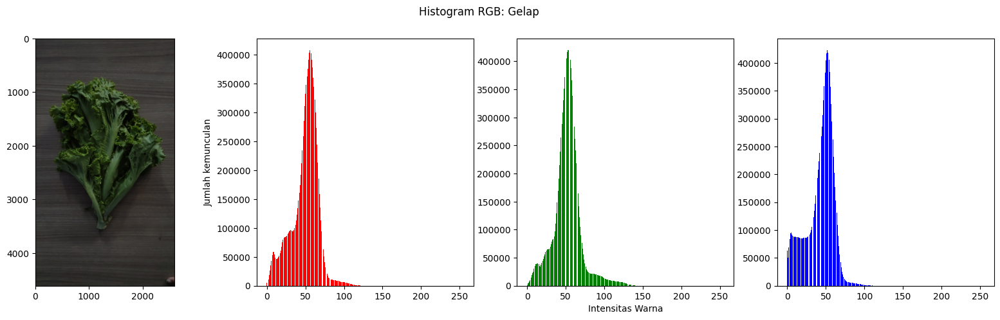

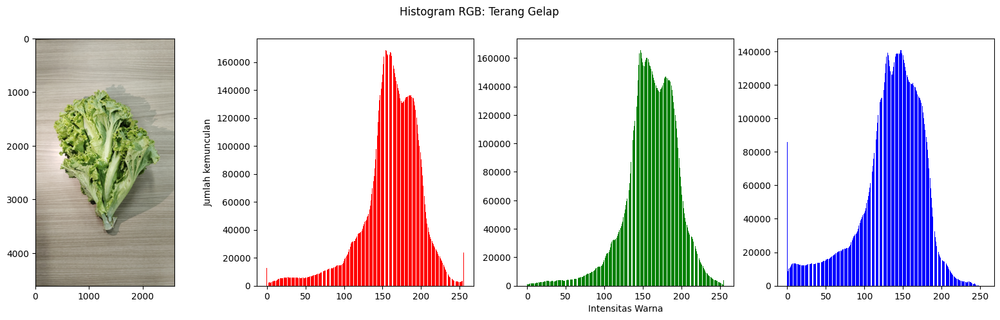

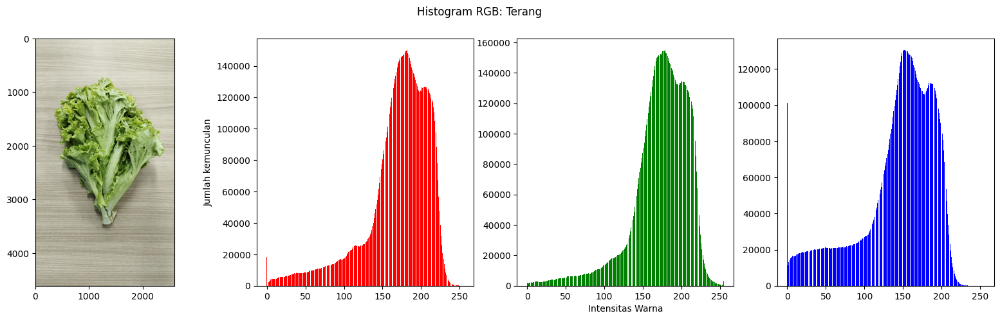

In [ ]:
def plot_img_with_hist(img_path, title, prefix_title=None):
  # Memuat citra dan mengubah BGR ke RGB
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  # Menghitung histogram perchannel warna
  red, bins = np.histogram(img[:,:,0].ravel(), bins=256, range=[0,256])
  green, bins = np.histogram(img[:,:,1].ravel(), bins=256, range=[0,256])
  blue, bins = np.histogram(img[:,:,2].ravel(), bins=256, range=[0,256])

  # Batas sumbu X
  names = np.arange(256)

  # Visualisasi
  fig, axs = plt.subplots(1, 4, figsize=(20, 5))
  if prefix_title:
    fig.suptitle(f'{prefix_title} {title}')
  else:
    fig.suptitle(f'Histogram RGB: {title}')
  axs[1].set_ylabel('Jumlah kemunculan')
  axs[2].set_xlabel('Intensitas Warna')
  axs[0].imshow(img)
  axs[1].bar(names, red, color='red')
  axs[2].bar(names, green, color='green')
  axs[3].bar(names, blue, color='blue')
  plt.show()

# Proses pada 3 citra
plot_img_with_hist('gelap.jpg', 'Gelap')
plot_img_with_hist('terang_gelap.jpg', 'Terang Gelap')
plot_img_with_hist('terang.jpg', 'Terang')

## 2. Terapkan transformasi brightness dan contrast (linear/log brightness).
- Tentukan nilai b (brightness) dan a (contrast) yang sesuai agar data tampak natural seperti data asli.

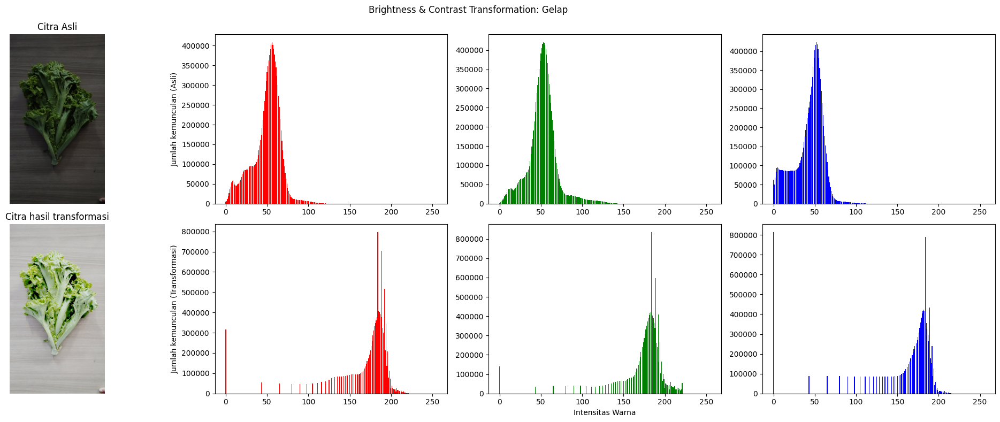

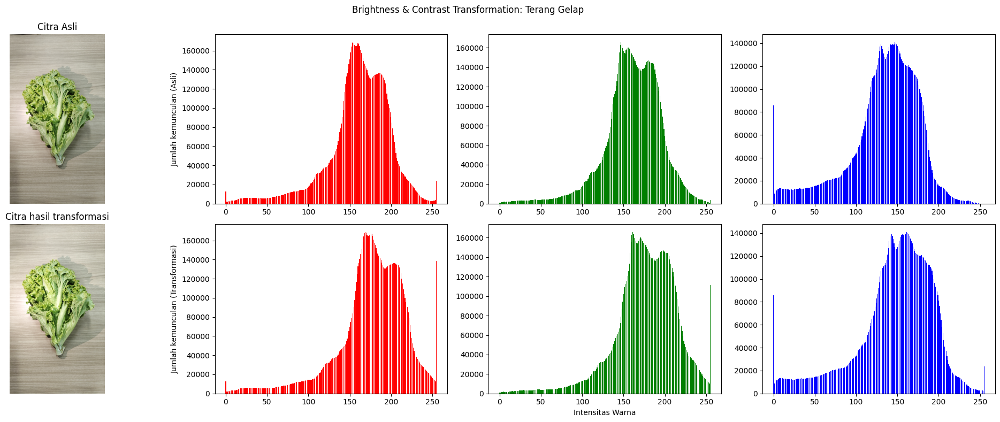

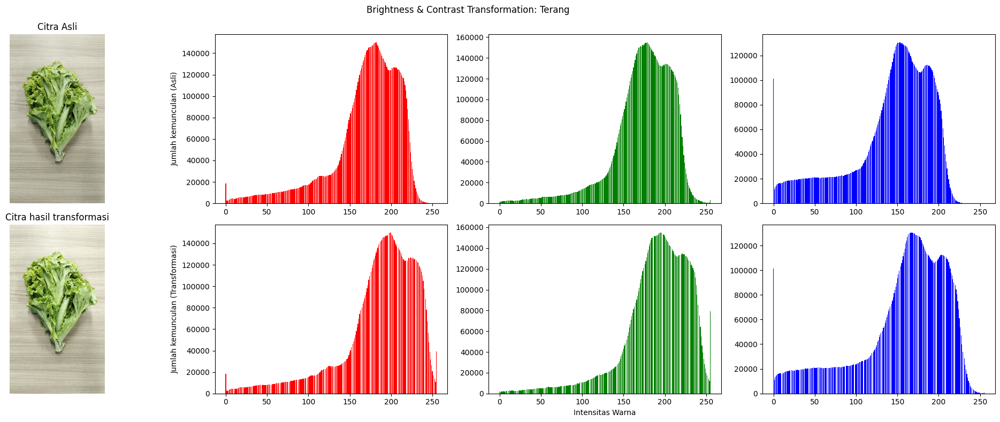

In [ ]:
def transform_log_brightness_contrast(img_path, title='', brightness=0, contrast=0, log_brightness=None, plot=True):
  # Memuat citra dan mengubah BGR ke RGB
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  # np array kosong
  img_transformed = np.zeros(img.shape, np.float32)

  # Hitung dengan contrast dan linear brightness
  img_transformed = np.clip(contrast * img.astype(np.float32) + brightness, 0, 255)
  if log_brightness is None: # Jika tidak menggunkan log brightness, jadikan ke uint8
    img_transformed = img_transformed.astype(np.uint8)
  else: # Jika paka log brightness
    img_transformed = np.clip(log_brightness * np.log1p(img_transformed), 0, 255).astype(np.uint8)

  # Menghitung histogram perchannel warna untuk citra asli
  red, bins = np.histogram(img[:,:,0].ravel(), bins=256, range=[0,256])
  green, bins = np.histogram(img[:,:,1].ravel(), bins=256, range=[0,256])
  blue, bins = np.histogram(img[:,:,2].ravel(), bins=256, range=[0,256])

  # Menghitung histogram perchannel warna untuk citra hasil transformasi
  red_trans, bins = np.histogram(img_transformed[:,:,0].ravel(), bins=256, range=[0,256])
  green_trans, bins = np.histogram(img_transformed[:,:,1].ravel(), bins=256, range=[0,256])
  blue_trans, bins = np.histogram(img_transformed[:,:,2].ravel(), bins=256, range=[0,256])

  if plot:
    # Batas sumbu X
    names = np.arange(256)

    # Visualisasi
    fig, axs = plt.subplots(2, 4, figsize=(20, 8))
    fig.suptitle(f'Brightness & Contrast Transformation: {title}')

    # Citra Asli dan Histogram
    axs[0][0].imshow(img)
    axs[0][0].set_title(f'Citra Asli')
    axs[0][0].axis('off')
    axs[0][1].bar(names, red, color='red')
    axs[0][2].bar(names, green, color='green')
    axs[0][3].bar(names, blue, color='blue')
    axs[0][1].set_ylabel('Jumlah kemunculan (Asli)')

    # Citra Transformasi dan Histogram
    axs[1][0].imshow(img_transformed)
    axs[1][0].set_title('Citra hasil transformasi')
    axs[1][0].axis('off')
    axs[1][1].bar(names, red_trans, color='red')
    axs[1][2].bar(names, green_trans, color='green')
    axs[1][3].bar(names, blue_trans, color='blue')
    axs[1][1].set_ylabel('Jumlah kemunculan (Transformasi)')
    axs[1][2].set_xlabel('Intensitas Warna')

    plt.tight_layout()
    plt.show()

  return img_transformed

transformed_imgs = {
  'gelap' : transform_log_brightness_contrast('gelap.jpg', 'Gelap', log_brightness=40, brightness=-20, contrast=2.2),
  'terang_gelap': transform_log_brightness_contrast('terang_gelap.jpg', 'Terang Gelap', brightness=0, contrast=1.1),
  'terang': transform_log_brightness_contrast('terang.jpg', 'Terang', brightness=0, contrast=1.1)
}

## 3. Lakukan histogram equalization untuk memperbaiki sebaran kontras.
- Bandingkan hasil visual dan histogram sebelum–sesudah.
- Perhatikan apakah motif dan detail kain lebih terlihat jelas.
- Pastikan tekstur daun atau permukaan sayur menjadi lebih terlihat.

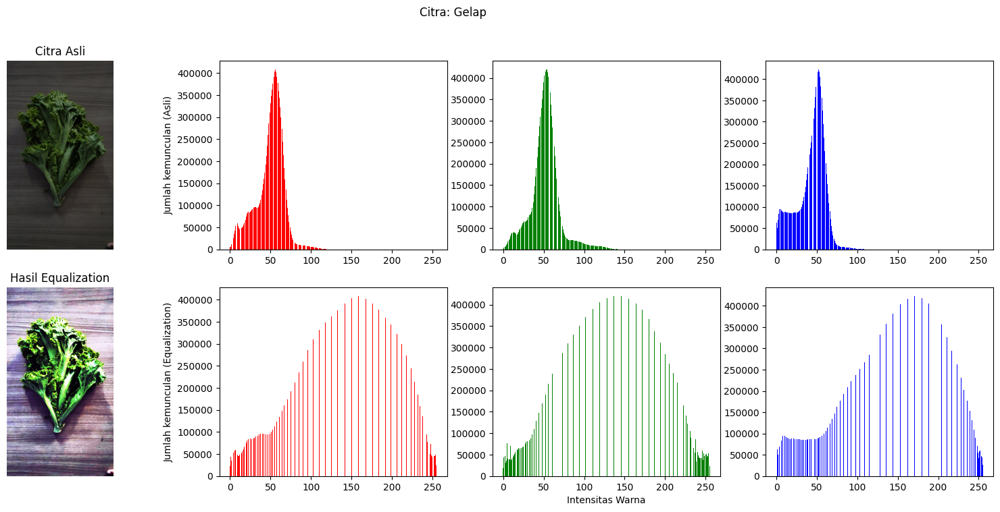

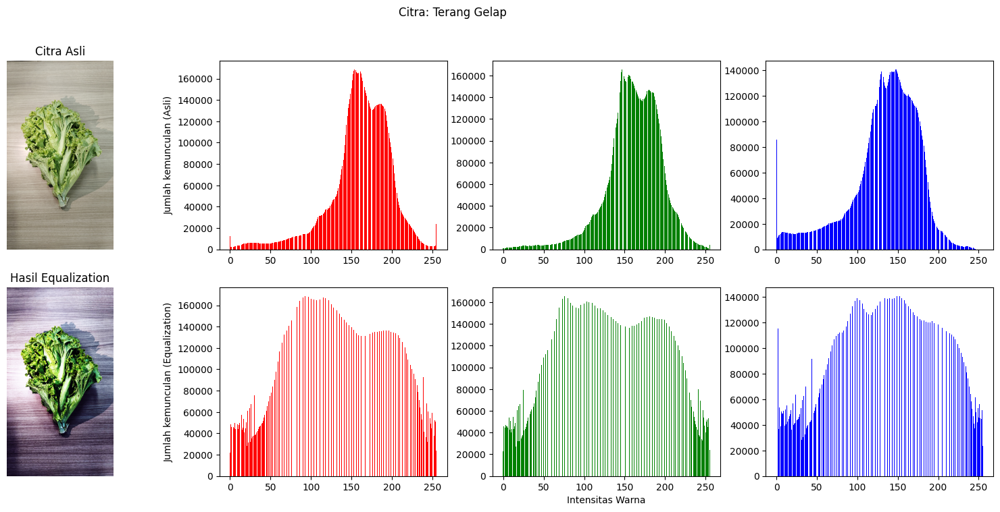

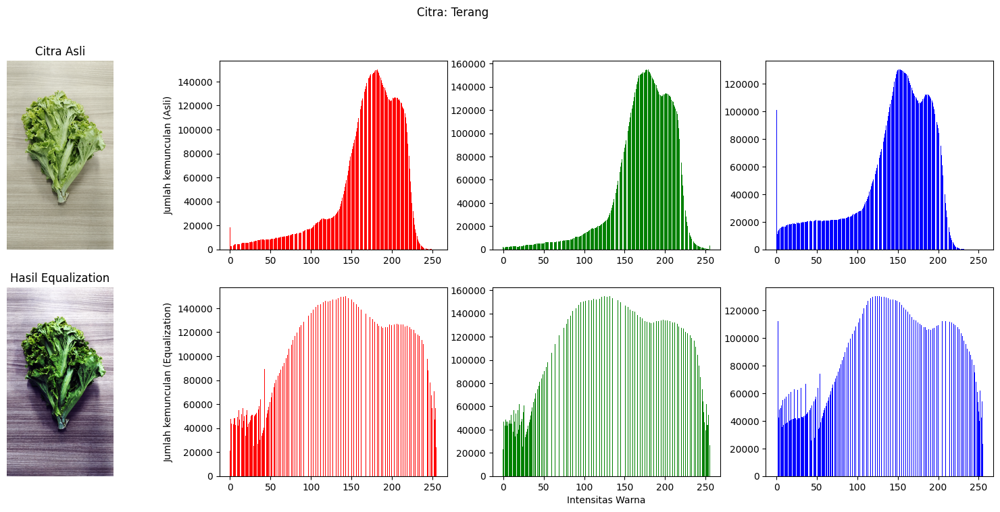

In [ ]:
def do_equalization(img_path='', title='title', plot=True, img=None):
  if img is None:
    # Memuat citra dan mengubah BGR ke RGB
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  r, g, b = cv2.split(img) # Split channel warna

  # Menghitung histogram untuk citra asli
  red, _ = np.histogram(r.ravel(), bins=256, range=[0,256])
  green, _ = np.histogram(g.ravel(), bins=256, range=[0,256])
  blue, _ = np.histogram(b.ravel(), bins=256, range=[0,256])

  # Fungsi equalization (Gonzalez & Woods, 2002).
  def hist_equalization(channel):
      hist, _ = np.histogram(channel.flatten(), bins=256, range=[0,256])
      N = channel.size
      L = 256
      p = hist / N
      cdf = p.cumsum()
      sk = np.round((L-1) * cdf).astype('uint8')

      img_eq = sk[channel]
      return img_eq

  # Lakukan equalization
  red_eq = hist_equalization(r)
  green_eq = hist_equalization(g)
  blue_eq = hist_equalization(b)
  # Membuat citra dari channel yang sudah diequalization
  img_eq = cv2.merge((red_eq, green_eq, blue_eq))

  # Menghitung histogram untuk citra equalization
  red_eq_hist, _ = np.histogram(red_eq.ravel(), bins=256, range=[0,256])
  green_eq_hist, _ = np.histogram(green_eq.ravel(), bins=256, range=[0,256])
  blue_eq_hist, _ = np.histogram(blue_eq.ravel(), bins=256, range=[0,256])

  if plot:
    # Visualisasi
    names = np.arange(256)
    fig, axs = plt.subplots(2, 4, figsize=(20, 8),)
    fig.suptitle(f'Citra: {title}')

    axs[0][0].imshow(img)
    axs[0][0].set_title(f'Citra Asli')
    axs[0][0].axis('off')
    axs[0][1].bar(names, red, color='red')
    axs[0][2].bar(names, green, color='green')
    axs[0][3].bar(names, blue, color='blue')
    axs[0][1].set_ylabel('Jumlah kemunculan (Asli)')


    axs[1][0].imshow(img_eq)
    axs[1][0].set_title('Hasil Equalization')
    axs[1][0].axis('off')
    axs[1][1].bar(names, red_eq_hist, color='red')
    axs[1][2].bar(names, green_eq_hist, color='green')
    axs[1][3].bar(names, blue_eq_hist, color='blue')
    axs[1][1].set_ylabel('Jumlah kemunculan (Equalization)')
    axs[1][2].set_xlabel('Intensitas Warna')

    plt.show()

  return img_eq

# Proses pada 3 citra
_ = do_equalization('gelap.jpg', 'Gelap')
_ = do_equalization('terang_gelap.jpg', 'Terang Gelap')
_ = do_equalization('terang.jpg', 'Terang')

## 4. Terapkan filter spasial:
- Low-pass filter untuk menghaluskan noise atau tekstur berlebih pada
permukaan kain, untuk menghaluskan noise pada permukaan atau bayangan di sekitar sayur.
- High-pass atau Laplacian filter untuk menajamkan tepi motif batik atau
untuk menajamkan tepi daun, batang, atau detail tekstur pada sayur.

In [ ]:
def conv_plot(img_path, kernel, title=None):
  # Memuat citra dan mengubah BGR ke RGB
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  # terapkan kernel dengan cv2.filter2D
  img_conv = cv2.filter2D(img, -1, kernel)

  # Visualisasi
  plt.figure(figsize=(20, 20))
  plt.subplot(1, 2, 1)
  plt.imshow(img)
  plt.title(f'Citra original - {title}')
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.imshow(img_conv)
  plt.title(f'Citra Konvolusi - {title}')
  plt.axis('off')
  plt.show()

### Low-pass

In [ ]:
# kernel_low_pass = np.ones((3,3), np.float32) / 9 # low pass avg

kernel_low_pass = np.array([ # gaussian
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1]
  ]) / 16

conv_plot('gelap.jpg', kernel_low_pass, 'Gelap - Low Pass')
conv_plot('terang_gelap.jpg', kernel_low_pass, 'Terang Gelap - Low Pass')
conv_plot('terang.jpg', kernel_low_pass, 'Terang - Low Pass')

### High-pass

In [ ]:
kernel_high_pass = np.array([[-1, -1, -1],
                            [-1,  8, -1],
                            [-1, -1, -1]])
conv_plot('gelap.jpg', kernel_high_pass, 'Gelap - High Pass')
conv_plot('terang_gelap.jpg', kernel_high_pass, 'Terang Gelap - High Pass')
conv_plot('terang.jpg', kernel_high_pass, 'Terang - High Pass')

## 5. Implementasikan Floyd–Steinberg Dithering untuk menurunkan kedalaman
warna sesuai data anda (bit-depth 4–6 bit), lalu analisis bagaimana efeknya
terhadap kehalusan gradasi warna motif batik setelah reduksi warna dilakukan
atau terhadap detail warna alami sayur

In [ ]:
def floyd_steinberg_dither_pillow(image_path=None, bit_depth=2, img=None):
    if img is None:
      img = Image.open(image_path).convert('RGB')
    else:
      img = Image.fromarray(img)

    num_colors = 2**bit_depth
    # Kurangi palet warna menggunakan quantize
    dithered_img = img.quantize(colors=num_colors, dither=Image.Dither.FLOYDSTEINBERG)

    return dithered_img

image_paths = ['gelap.jpg', 'terang_gelap.jpg', 'terang.jpg']
bit_depths = [4, 5, 6]

for img_path in image_paths:
    img_original = Image.open(img_path).convert('RGB')

    plt.figure(figsize=(35,25))
    plt.subplot(1, len(bit_depths) + 1, 1)
    plt.imshow(img_original)
    plt.title(f'Asli: {img_path}')
    plt.axis('off')

    for i, bit_depth in enumerate(bit_depths):
        dithered_img_pillow = floyd_steinberg_dither_pillow(img_path, bit_depth)
        plt.subplot(1, len(bit_depths) + 1, i + 2)
        plt.imshow(dithered_img_pillow)
        plt.title(f'Dithered ({bit_depth} bits)')
        plt.axis('off')
    plt.show()

# Bagian B – Analisis
Jawablah dalam bentuk narasi atau tabel analisis singkat:
1. Bagaimana perubahan nilai brightness dan contrast memengaruhi hasil histogram
dari data gelap?

    Jawab:

    Perubahan nilai brightness (kecerahan) dan contrast (kontras) secara signifikan memengaruhi distribusi intensitas piksel yang direpresentasikan dalam histogram. Pada data "gelap.jpg", histogram awalnya menunjukkan bahwa sebagian besar piksel terkonsentrasi di sisi kiri (nilai intensitas rendah), yang menandakan gambar yang gelap. Setelah menerapkan transformasi contrast sebesar 2.2 dan log brightness sebesar 42, histogram menjadi lebih terkonsentrasi di sisi kanan (nilai intesitas tinggi). Menaikkan nilai contrast akan "merentangkan" rentang intensitas piksel, membuat area gelap menjadi lebih gelap dan area terang menjadi lebih terang, sehingga sebaran histogram melebar. Sementara itu, penyesuaian brightness akan menggeser keseluruhan distribusi histogram ke kanan (lebih terang) atau ke kiri (lebih gelap). Kombinasi keduanya pada data gelap bertujuan untuk mendistribusikan kembali intensitas piksel ke seluruh rentang sehingga detail yang tadinya tidak terlihat menjadi tampak lebih jelas. Tambahan penggunaan log brightness memberikan efek peningkatan kecerahan yang nonlinear, di mana piksel dengan intensitas rendah akan meningkat lebih signifikan dibanding piksel dengan intensitas tinggi. Sehingga area gelap menjadi lebih terang tanpa menyebabkan area terang mengalami overexposure.

2. Apakah histogram equalization selalu memperbaiki detail data? Jelaskan alasannya dengan contoh hasil Anda.

    Jawab:

    Histogram equalization tidak selalu memperbaiki detail data. Teknik ini bekerja dengan meratakan dan mendistribusikan ulang intensitas piksel pada citra. Pada gambar dengan kontras yang sudah cukup baik atau pada area tertentu yang tidak memerlukan penyesuaian, histogram equalization justru dapat menyebabkan hilangnya detail minor atau bahkan meningkatkan noise. Sebagai contoh, pada hasil percobaan Anda, jika diterapkan pada citra sayur yang sudah terang, equalization dapat membuat beberapa area menjadi terlalu terang (over-exposed), sehingga tekstur halus pada daun selada malah menjadi kurang terlihat atau menyatu dengan latar belakang. Teknik ini paling efektif pada citra yang histogramnya sangat terkonsentrasi di satu area, seperti pada data gelap.

3. Bandingkan hasil low-pass dan high-pass filter pada area data — bagian mana yang paling terpengaruh?

    Jawab:

    Low-pass filter dan high-pass filter memengaruhi area data dengan cara yang berlawanan.
    - Low-pass filter: Berfungsi untuk menghaluskan (smoothing) citra. Area yang paling terpengaruh adalah bagian-bagian dengan perubahan intensitas yang cepat, seperti tepi-tepi daun dan tekstur atau urat daun yang detail. Setelah difilter, area-area ini akan terlihat lebih kabur (blur), dan noise pada gambar akan berkurang.
    - High-pass filter: Berfungsi untuk menajamkan (sharpening) citra. Filter ini juga mempengaruhi area yang sama (tepi daun dan tekstur detail), tetapi dengan efek sebaliknya. Area-area ini akan menjadi lebih tegas dan jelas, menonjolkan detail yang ada.

    Jadi, bagian yang paling terpengaruh oleh kedua filter ini adalah area dengan detail dan frekuensi tinggi seperti tepi dan tekstur objek.


4. Mengapa proses dithering bisa mempertegas atau justru mengaburkan detail data?

    Jawab:

    Proses dithering, seperti algoritma Floyd-Steinberg, bertujuan untuk mengurangi kedalaman warna (misalnya dari 8-bit ke 4-bit) sambil memberikan ilusi visual bahwa ada lebih banyak warna daripada yang sebenarnya. Efeknya pada detail bisa mempertegas atau justru mengaburkan:
    - Mempertegas Detail: Dithering dapat mempertegas gradasi warna yang halus. Di area di mana perubahan warna tidak terlalu kentara, dithering menciptakan pola titik-titik yang membuat transisi warna tersebut lebih terlihat oleh mata manusia.
    - Mengaburkan Detail: Di sisi lain, jika citra memiliki tekstur yang sangat halus atau detail kecil, pola titik-titik dari proses dithering dapat "mengganggu" atau tumpang tindih dengan detail asli tersebut, sehingga membuatnya menjadi kabur atau hilang. Efek ini sangat bergantung pada palet warna yang digunakan dan resolusi gambar.

    
5. Berdasarkan hasil percobaan Anda, kombinasi teknik mana yang paling efektif untuk meningkatkan readability fitur data batik / data sayur sebelum tahap deteksi?

    Jawab:

    Berdasarkan hasil percobaan pada citra sayur (selada) dan tujuan untuk meningkatkan readability fitur sebelum tahap deteksi, kombinasi teknik yang paling efektif adalah:
    - Transformasi Brightness dan Contrast: Ini adalah langkah awal yang krusial, terutama untuk data gelap, untuk menormalkan pencahayaan dan menonjolkan fitur utama.
    - Histogram Equalization: Langkah ini sangat berguna untuk memaksimalkan kontras secara global setelah penyesuaian brightness/contrast, memastikan seluruh rentang intensitas termanfaatkan.
    - High-Pass Filter: Untuk tujuan deteksi fitur seperti tepi daun pada sayuran, penajaman menggunakan high-pass filter (seperti filter Laplacian) sangat efektif. Ini akan membuat batas antara objek (daun) dan latar belakang menjadi lebih jelas, yang sangat membantu algoritma deteksi. Dithering kurang disarankan untuk tahap pra-pemrosesan sebelum deteksi, karena tujuannya adalah mengurangi palet warna yang dapat menghilangkan informasi warna dan tekstur penting yang dibutuhkan oleh model deteksi modern.


# Bagian C – Implementasi (Python–OpenCV)
Gunakan struktur kode seperti:

Kemudian tampilkan hasil 4 tahap (asli → BC → HE → Filter → Dithered).

In [ ]:
def bagian_c(img_path, title, kernel, dither_bit_depth, BC_params):
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Brightness & Contrast dengan function pada langkah A
    img_bc = transform_log_brightness_contrast(img_path, '', plot=False, **BC_params)

    # Histogram Equalization dengan function pada langkah A
    img_he = do_equalization(img=img_bc, plot=False)

    # Filtering
    img_hp = cv2.filter2D(img_he, -1, kernel)

    # Dithered menggunakan floyd_steinberg_dither_pillow yang sudah ada
    dithered_img_pillow = floyd_steinberg_dither_pillow(img=img_hp, bit_depth=dither_bit_depth)

    # Visualisasi
    plt.figure(figsize=(20, 10))
    plt.title(title)
    plt.axis('off')

    plt.subplot(1, 5, 1)
    plt.imshow(img_rgb)
    plt.title(f'Asli')
    plt.axis('off')

    plt.subplot(1, 5, 2)
    plt.imshow(img_bc, cmap='gray')
    plt.title(f'Brightness & Contrast')
    plt.axis('off')

    plt.subplot(1, 5, 3)
    plt.imshow(img_he, cmap='gray')
    plt.title(f'Histogram Equalization')
    plt.axis('off')

    plt.subplot(1, 5, 4)
    plt.imshow(img_hp, cmap='gray')
    plt.title(f'Filtering')
    plt.axis('off')

    plt.subplot(1, 5, 5)
    plt.imshow(dithered_img_pillow)
    plt.title(f'Dithered ({dither_bit_depth} bit)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return dithered_img_pillow

## tampilkan hasil 4 tahap (asli → BC → HE → Filter → Dithered).

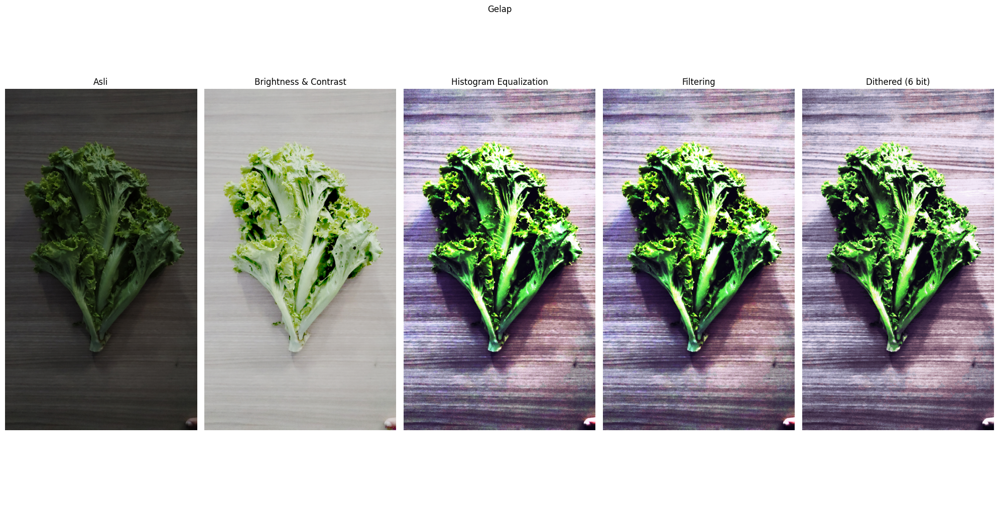

In [ ]:
tahapc_imgs = {
  "gelap": bagian_c('gelap.jpg', 'Gelap',
                    kernel=kernel_low_pass, dither_bit_depth=6,
                    BC_params={'log_brightness': 40, 'brightness': -20, 'contrast': 2.2})
}

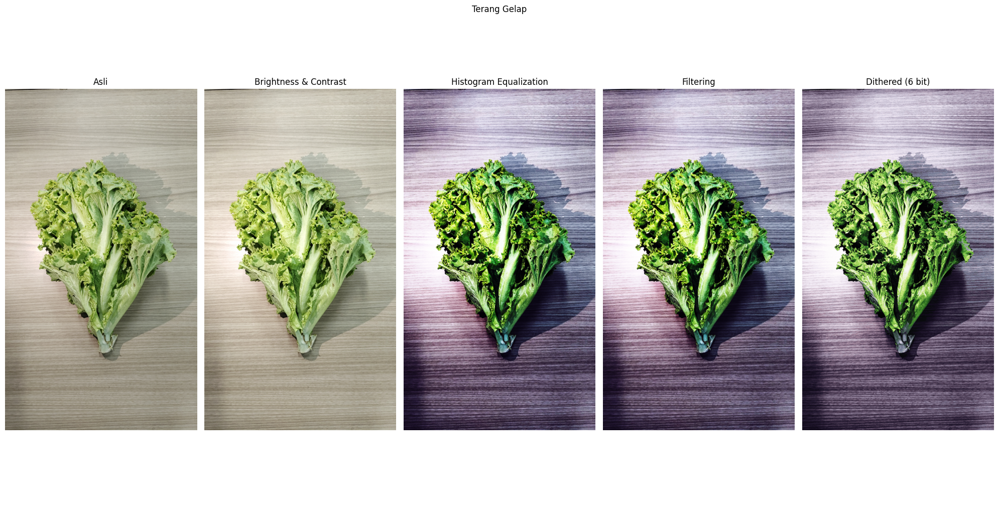

In [ ]:
tahapc_imgs['terang_gelap'] = bagian_c('terang_gelap.jpg', 'Terang Gelap',
                                       kernel=kernel_low_pass, dither_bit_depth=6,
                                       BC_params={'brightness': 0, 'contrast': 1.1})

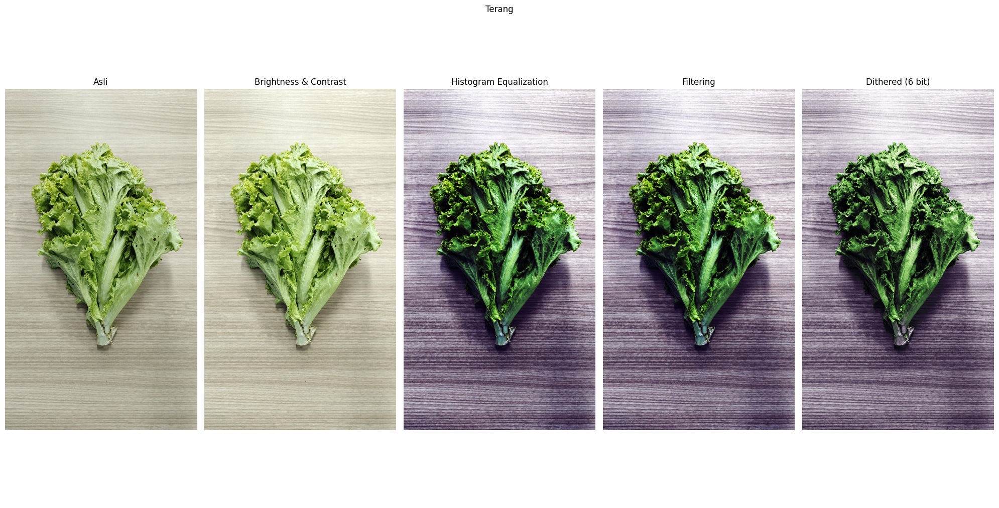

In [ ]:
tahapc_imgs['terang'] = bagian_c('terang.jpg', 'Terang',
                                 kernel=kernel_low_pass, dither_bit_depth=6,
                                 BC_params={'brightness': 0, 'contrast': 1.1})

# Bagian D – Analisis Akhir & Kesimpulan
Tuliskan 1 halaman analisis:
- Urutan proses terbaik untuk menghasilkan citra paling siap recognition
    - Pertama melakukan perbaikan pencahayaan untuk menormalkan intensitas cahaya dari gambar gelap atau terang sebagian.
    - Kedua melakukan penerapan filter low-pass, high-pass untuk menghaluskan permukaan, mengurangi noise yang tidak diinginkan, menajamkan bagian tepi dan batang supaya bentuk dan tekstur lebih mudah untuk dikenali.
    - Ketiga melakukan evaluasi dengan hasil PSNR untuk memastikan citra hasil transformasi masih mempertahankan kualitas asli.

- Perbandingan nilai PSNR antara citra asli yang memiliki pencahanyaan baik dan hasil pra-pemrosesan
    - Citra gelap : 27.91 dB
    - Citra terang sebagian : 27.92 dB
    - Citra terang : 27.82 dB

- Rekomendasi metode peningkatan kualitas data sesuai object untuk sistem klasifikasi motif batik atau untuk sistem identifikasi jenis sayuran
    - Menggunakan kombinasi low-pass dan high-pass untuk menyeimbangkan denoising dan edge enhancement.
    - Menormalisasi histogram sebelum filtering agar pencahayaan lebih konsisten.


In [ ]:
import math

def calculate_psnr(original_img, processed_img):
    """
    Calculates the Peak Signal-to-Noise Ratio (PSNR) between two images.

    Args:
        original_img (numpy.ndarray): The original image.
        processed_img (numpy.ndarray): The processed image.

    Returns:
        float: The PSNR value.
    """
    mse = np.mean((original_img - processed_img) ** 2)
    if mse == 0:
        return 100
    max_pixel = 255.0
    psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
    return psnr

def load_image(img_path):
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img

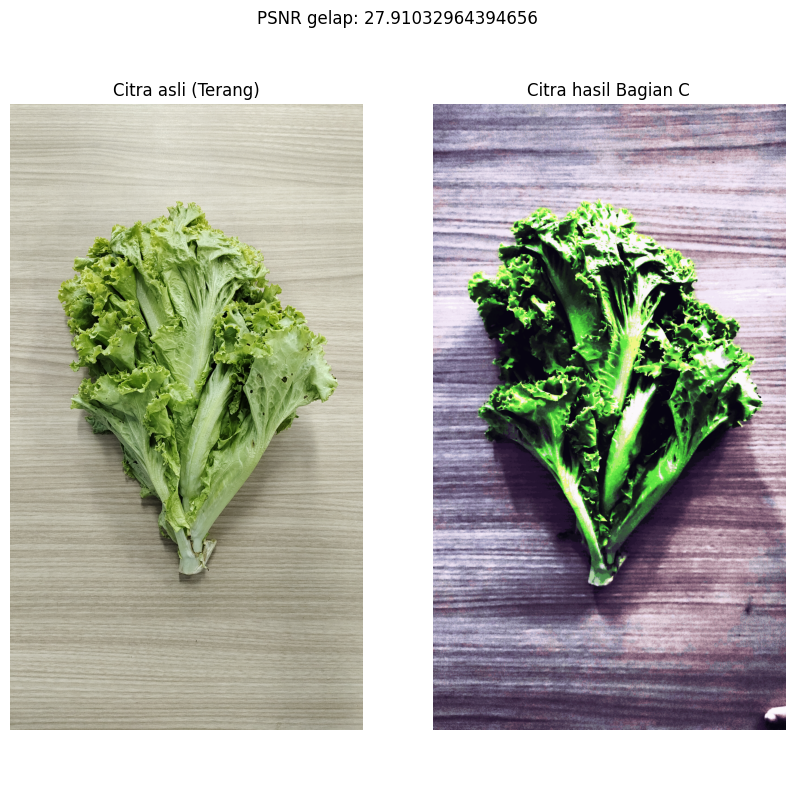

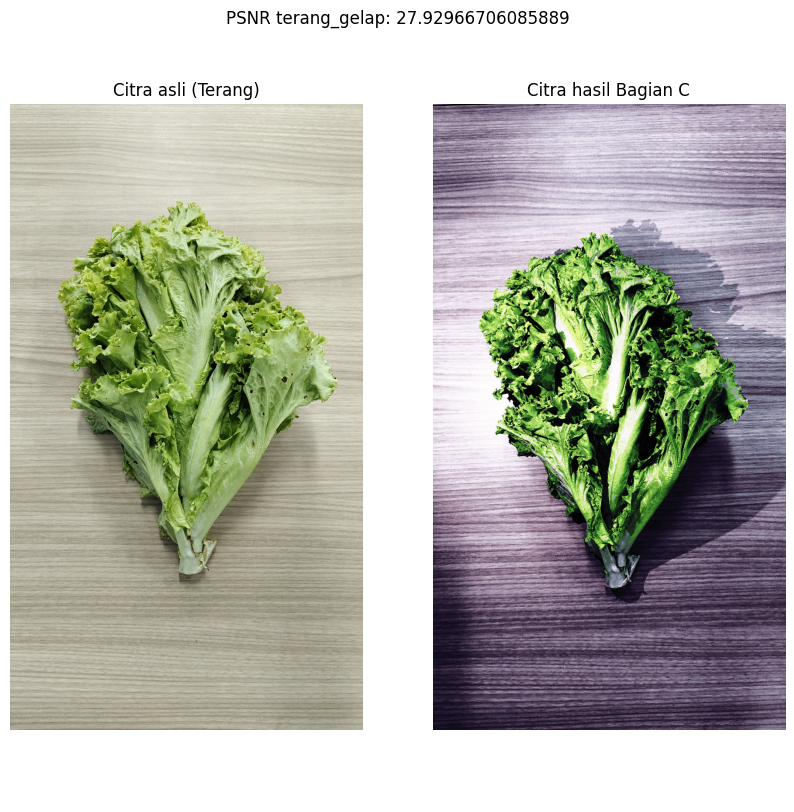

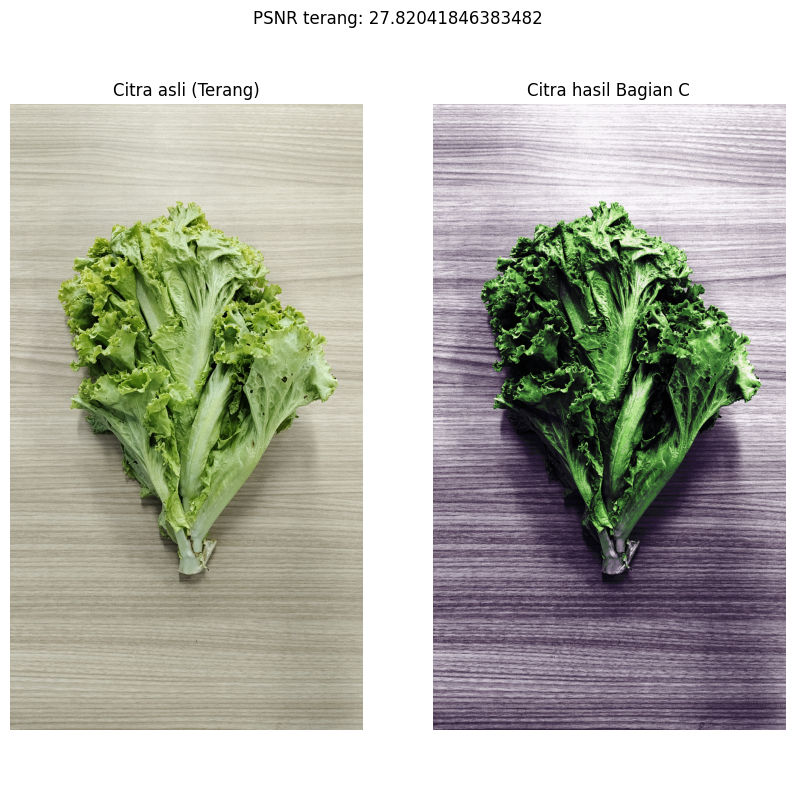

In [ ]:
imgs_title = ['gelap', 'terang_gelap', 'terang']

asli = load_image(f"terang.jpg")
for i in imgs_title:
  img_tidak_asli = tahapc_imgs[i]

  # Konversi PIL Image ke format cv2
  img_tidak_asli_np = np.array(img_tidak_asli)
  img_tidak_asli_rgb = cv2.cvtColor(np.array(img_tidak_asli.convert('RGB')), cv2.IMREAD_COLOR)


  plt.figure(figsize=(10, 10))
  plt.axis('off')
  plt.title(f'PSNR {i}: {calculate_psnr(asli, img_tidak_asli_rgb)}')
  plt.subplot(1, 2, 1)
  plt.imshow(asli)
  plt.title(f'Citra asli (Terang)')
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.title('Citra hasil Bagian C')
  plt.axis('off')
  plt.imshow(img_tidak_asli_rgb)
  plt.show()